# Machine Learning Unsupervised


## Clustering on a breast cancer dataset

In this exercise, we will perform clustering on a set which contains samples that are diagnosed with breast cancer (malignant samples) and samples that are healthy (benign samples). We will use dimensionality reduction techniques and clustering techniques as discussed in ML chapter 8 and the syllabus on Cluster Analysis.

__Goal:__
The purpose of this notebook is to learn how to use several unsupervised learning algorithms using sklearn.   

__At the end of this notebook you will be able to:__
> 1. Run a K-means, DBSCAN, HAC and spectral algorithm.
> 2. Understand how you can configure the algorithm.
> 3. Know how to determine the optimal number of clusters.
> 4. Understand how you can evaluate the performance of the algorithms.
> 5. Know the advantages and disadvantages of the algorithms.



## The dataset
The data can be downloaded here: https://www.kaggle.com/uciml/breast-cancer-wisconsin-data/data. For a description of the data, see here: https://www.kaggle.com/uciml/breast-cancer-wisconsin-data. We have the labels for the samples, so we can use this data set to evaluate clustering algorithms.

1. Load the data
2. Inspect the data.
    - How many samples are classified as Benign, and how many as Malignant?
    - What features are there? What do the column names mean?
    - Are there missing values?
    - Can all features be used or do we have to throw some away?
    - How are the features distributed

3. Make the data set ready for clustering. Remember to remove the diagnosis-column, as this should not be input for clustering. However, this data must be stored separately so it can be used for performance evaluation of the clustering.

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler


In [2]:
# Read the data file
data = pd.read_csv('data.csv')

data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [3]:
data['diagnosis'].value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

### Solution
We see that there are 357 Benign samples and 212 Malignant. 

Note that all features are numeric, except for the Unnamed feature (which must be removed) and the diagnosis which is M or B. This feature has to be mapped to B = 0 and M = 1. Furthermore, the id feature holds no information and must be removed. 

Remember that the diagnosis contains the labels of this set. They must also be removed from the data set that is used for clustering, but they should be stored for comparison with the clustering results. 

What is the dimension of the remaining data set?

In [4]:
# Cleaning and modifying the data
data = data.drop('id',axis=1)
data = data.drop('Unnamed: 32',axis=1)
# Mapping Benign to 0 and Malignant to 1 
data['diagnosis'] = data['diagnosis'].map({'M':1,'B':0})



In [5]:
data.dtypes

diagnosis                    int64
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst                 float64
smoothness_worst           float64
compactness_worst          float64
concavity_worst            float64
concave points_worst

In [6]:
corr_mat = data.corr()
# Strip out the diagonal values for the next step
for x in range(len(data.columns)):
    corr_mat.iloc[x,x] = 0.0
    
corr_mat

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
diagnosis,0.000000,0.730029,0.415185,0.742636,0.708984,0.358560,0.596534,0.696360,0.776614,0.330499,...,0.776454,0.456903,0.782914,0.733825,0.421465,0.590998,0.659610,0.793566,0.416294,0.323872
radius_mean,0.730029,0.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,...,0.969539,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066
texture_mean,0.415185,0.323782,0.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,...,0.352573,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205
perimeter_mean,0.742636,0.997855,0.329533,0.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,...,0.969476,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019
area_mean,0.708984,0.987357,0.321086,0.986507,0.000000,0.177028,0.498502,0.685983,0.823269,0.151293,...,0.962746,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738
smoothness_mean,0.358560,0.170581,-0.023389,0.207278,0.177028,0.000000,0.659123,0.521984,0.553695,0.557775,...,0.213120,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316
compactness_mean,0.596534,0.506124,0.236702,0.556936,0.498502,0.659123,0.000000,0.883121,0.831135,0.602641,...,0.535315,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382
concavity_mean,0.696360,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,0.000000,0.921391,0.500667,...,0.688236,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930
concave points_mean,0.776614,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,0.000000,0.462497,...,0.830318,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661
symmetry_mean,0.330499,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,0.000000,...,0.185728,0.090651,0.219169,0.177193,0.426675,0.473200,0.433721,0.430297,0.699826,0.438413


In [7]:
# see with features are highly correlated
# Pairwise maximal correlations
corr_mat.abs().idxmax()

diagnosis                     concave points_worst
radius_mean                         perimeter_mean
texture_mean                         texture_worst
perimeter_mean                         radius_mean
area_mean                              radius_mean
smoothness_mean                   smoothness_worst
compactness_mean                    concavity_mean
concavity_mean                 concave points_mean
concave points_mean                 concavity_mean
symmetry_mean                       symmetry_worst
fractal_dimension_mean     fractal_dimension_worst
radius_se                             perimeter_se
texture_se                             symmetry_se
perimeter_se                             radius_se
area_se                                  radius_se
smoothness_se                 fractal_dimension_se
compactness_se                fractal_dimension_se
concavity_se                        compactness_se
concave points_se                     concavity_se
symmetry_se                    

In [8]:
# how much are they correlated? Can we eliminate certain features based on high correlations
corr_mat.abs().max()

diagnosis                  0.793566
radius_mean                0.997855
texture_mean               0.912045
perimeter_mean             0.997855
area_mean                  0.987357
smoothness_mean            0.805324
compactness_mean           0.883121
concavity_mean             0.921391
concave points_mean        0.921391
symmetry_mean              0.699826
fractal_dimension_mean     0.767297
radius_se                  0.972794
texture_se                 0.411621
perimeter_se               0.972794
area_se                    0.951830
smoothness_se              0.427374
compactness_se             0.803269
concavity_se               0.801268
concave points_se          0.771804
symmetry_se                0.449137
fractal_dimension_se       0.803269
radius_worst               0.993708
texture_worst              0.912045
perimeter_worst            0.993708
area_worst                 0.984015
smoothness_worst           0.805324
compactness_worst          0.892261
concavity_worst            0

In [ ]:
#much of them are correlated, might be that reduced features perform better

In [9]:
# .skew 0: no skew, + right skew, - left skew, look for above .75 
skew_columns = (data
                .skew()
                .sort_values(ascending=False))

skew_columns = skew_columns.loc[skew_columns > 0.75]
skew_columns

area_se                    5.447186
concavity_se               5.110463
fractal_dimension_se       3.923969
perimeter_se               3.443615
radius_se                  3.088612
smoothness_se              2.314450
symmetry_se                2.195133
compactness_se             1.902221
area_worst                 1.859373
fractal_dimension_worst    1.662579
texture_se                 1.646444
area_mean                  1.645732
compactness_worst          1.473555
concave points_se          1.444678
symmetry_worst             1.433928
concavity_mean             1.401180
fractal_dimension_mean     1.304489
compactness_mean           1.190123
concave points_mean        1.171180
concavity_worst            1.150237
perimeter_worst            1.128164
radius_worst               1.103115
perimeter_mean             0.990650
radius_mean                0.942380
dtype: float64

In [10]:
# Perform log transform on skewed columns
for col in skew_columns.index.tolist():
    data[col] = np.log1p(data[col])


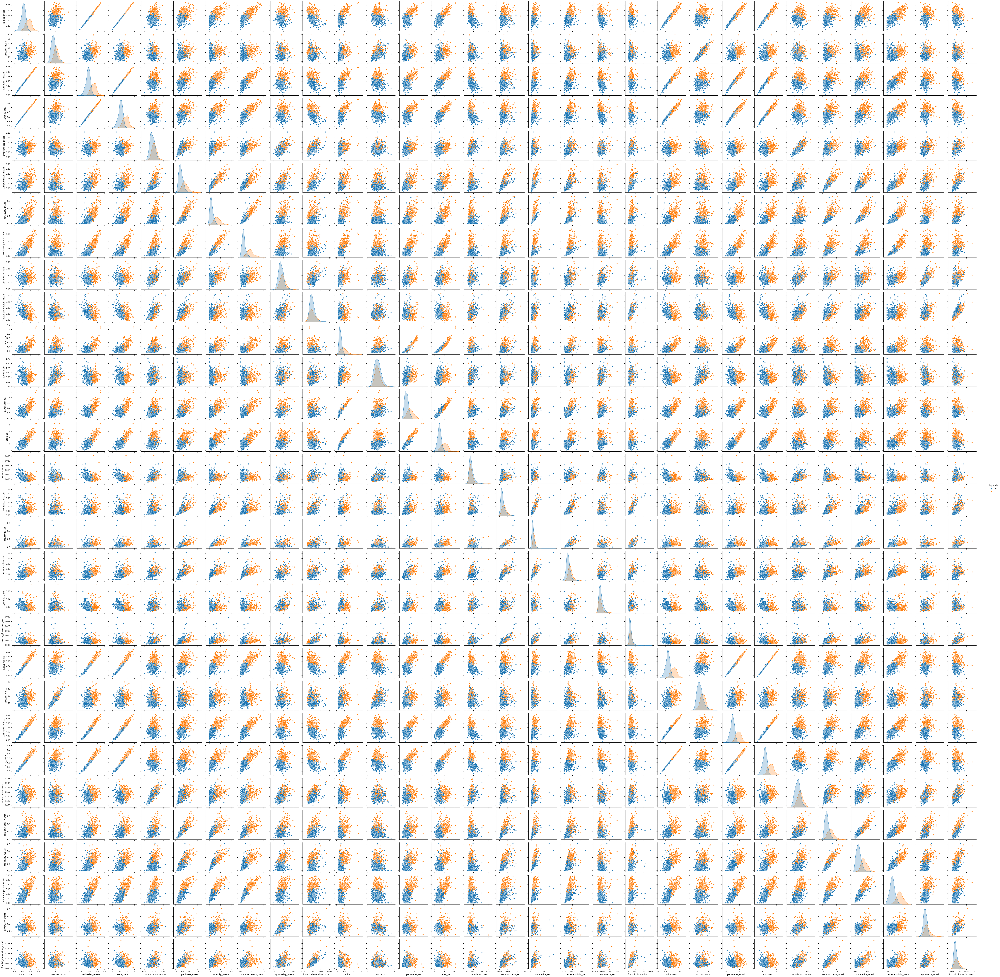

In [11]:
import seaborn as sns
sns.set_context('notebook')
sns.pairplot(data, 
             hue='diagnosis');

In [12]:
# Scaling the dataset
datas = pd.DataFrame(preprocessing.scale(data.iloc[:,1:32]))
datas.columns = list(data.iloc[:,1:32].columns)
datas['diagnosis'] = data['diagnosis']
# Creating the high dimensional feature space X
data_drop = datas.drop('diagnosis',axis=1)
X = data_drop.values

## Dimensionality reduction - PCA

We want to reduce the dimension of the dataset first. We start by using PCA. Usually, the first two principal components are used to plot and inspect the shape of the data. Sometimes also inspecting the next few principal components give insight in variance of the data. For this, also the explained variance per component must be taken into account. 

We consider PCA here for two reasons:
1. Find out whether this is a good visualization for the dataset.
2. Find out whether using the first few principal components for clustering is a good alternative for doing clustering on the original (high-dimensional) data set.

Make a plot of PC1 vs PC2, colored by the actual diagnosis of each sample. Is this a good visualization?

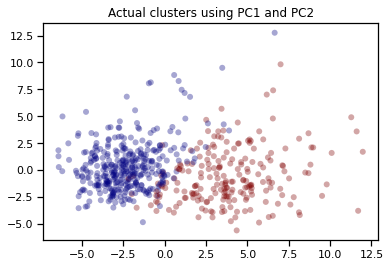

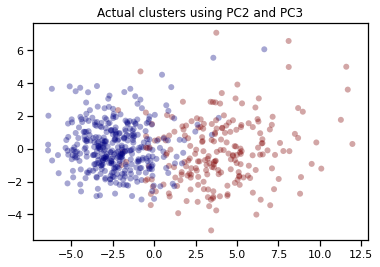

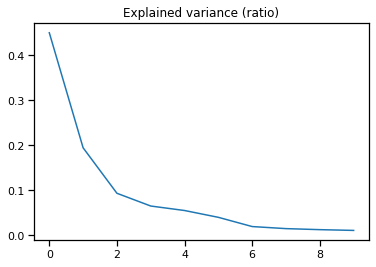

In [13]:
from sklearn.decomposition import PCA

X = StandardScaler().fit_transform(X)

pca = PCA(n_components=10)
principalComponents = pca.fit_transform(X)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['pc1', 'pc2', 'pc3','pc4','pc5','pc6','pc7','pc8','pc9','pc10'])
principalDf.head()

plt.scatter(principalDf['pc1'], principalDf['pc2'],  c = datas['diagnosis'], cmap = "jet", edgecolor = "None", alpha=0.35)
plt.title('Actual clusters using PC1 and PC2')
plt.show()


plt.scatter(principalDf['pc1'], principalDf['pc3'],  c = datas['diagnosis'], cmap = "jet", edgecolor = "None", alpha=0.35)
plt.title('Actual clusters using PC2 and PC3')
plt.show()

plt.plot(pca.explained_variance_ratio_)
plt.title('Explained variance (ratio)')
plt.show()


### Solution
We see that after the first two PCs, the explained variance drops quickly. The PCA does not yield a proper cluster separation. So, although PCA is helpful for dimensionality reduction, it is not great for visualization. Let's move on and try tSNE - a method that is useful for visualization of high-dimensional datasets as it results in a 2D projection of the high dimensional datast. 

## tSNE

Next, we'll try tSNE on the dataset.
1. Run TSNE with default perplexity on the data set. Run tSNE several times. Does tSNE always give the same results when the parameters are held the same?
2. Vary the perplexity parameter and compare the results.
3. Color the plot by the diagnosis of each point. Pick a nice result to work with in the following exercises. 

 

In [14]:
#Creating a 2D visualization to visualize the clusters
from sklearn.manifold import TSNE
tsne = TSNE(verbose=1, perplexity=40, n_iter= 4000)
Y = tsne.fit_transform(X)


/Users/lytsding/.venv/coursera/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/lytsding/.venv/coursera/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 569 samples in 0.000s...
[t-SNE] Computed neighbors for 569 samples in 0.072s...
[t-SNE] Computed conditional probabilities for sample 569 / 569
[t-SNE] Mean sigma: 1.614685
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.256927
[t-SNE] KL divergence after 2800 iterations: 0.914336


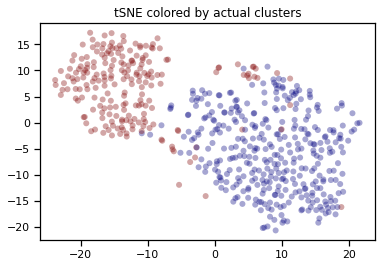

In [15]:
plt.scatter(Y[:,0],Y[:,1],  c = datas['diagnosis'], cmap = "jet", edgecolor = "None", alpha=0.35)
plt.title('tSNE colored by actual clusters')
plt.show()

## Next steps

We will do the following two things in the rest of this notebook:

1. Assuming that there are two clusters (a cluster for benign and a cluster for malignant samples), see which clustering algorithm performs best given the ground truth. 
2. It looks a bit like the malignant separate into two clusters, bringing the total number of clusters to 3. Can we find evidence that this is the right cluster, or maybe even find significant differences between the two malignant clusters?

We start with 1. Note that, while tSNE is itself quite good in separating clusters, the clustering is usually done in high-dimensional space (so, on the original data set X, rather than on the dimensionally reduced data set Y), and tSNE is only used as a visualization method.


## K-means clustering
Perform the following steps using KMeans and n_clusters = 2. 
1. Perform K-means clustering on X, that is, the original (scaled) dataset.
2. Perform K-means on the result of tSNE.
3. Perform K-means on the dataset consisting of PC1 and PC2.
4. Perform K-means on the dataset consisting of PC2 and PC3.
5. Compare the results of step 1-4 to the ground truth. What do you see? Is the dataset of PC1 and PC2 a good representative of the whole dataset (in terms of clustering)? What about the tSNE dataset? Or the dataset consisting of PC2 and PC3? How do you explain your observations?
6. Compute the adjusted rand index (ARI) for the clustering on X.


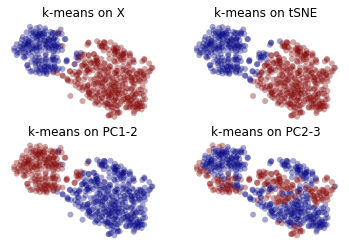

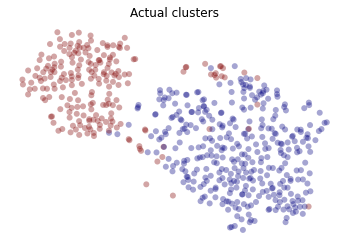

In [19]:
#Cluster using k-means

# K-means on original data
from sklearn.cluster import KMeans
kmns = KMeans(n_clusters=2, init='k-means++')
kY = kmns.fit_predict(X)

plt.subplot(221)
plt.scatter(Y[:,0],Y[:,1],  c=kY, cmap = "jet", edgecolor = "None", alpha=0.35)
plt.title('k-means on X')
plt.axis('off')



# K-means on tSNE results
kmns = KMeans(n_clusters=2, init='k-means++')
kY = kmns.fit_predict(Y)

plt.subplot(222)
plt.scatter(Y[:,0],Y[:,1],  c=kY, cmap = "jet", edgecolor = "None", alpha=0.35)
plt.title('k-means on tSNE')
plt.axis('off')


# K-means on PC 1 - 2
kmns = KMeans(n_clusters=2, init='k-means++')
kY = kmns.fit_predict(principalDf.iloc[:,0:1])

plt.subplot(223)
plt.scatter(Y[:,0],Y[:,1],  c=kY, cmap = "jet", edgecolor = "None", alpha=0.35)
plt.title('k-means on PC1-2')
plt.axis('off')

kmns = KMeans(n_clusters=2, init='k-means++')
kY = kmns.fit_predict(principalDf.iloc[:,1:2])

plt.subplot(224)
plt.scatter(Y[:,0],Y[:,1],  c=kY, cmap = "jet", edgecolor = "None", alpha=0.35)
plt.title('k-means on PC2-3')
plt.axis('off')
plt.show()


plt.scatter(Y[:,0],Y[:,1],  c = datas['diagnosis'], cmap = "jet", edgecolor = "None", alpha=0.35)
plt.title('Actual clusters')
plt.axis('off')
plt.show()

In [25]:
# ARI
from sklearn import metrics
from sklearn import cluster


kmns = KMeans(n_clusters=2, init='k-means++')
kY = kmns.fit_predict(X)

metrics.adjusted_rand_score(kY, datas['diagnosis'])


0.7061816782323744

## Other clustering techniques

Use other clustering techniques and see if you can improve on the ARI.

1. Perform **spectral clustering** on X and visualize the clustering results on the tSNE-result. Try different parameter settings untill a proper clustering is found, and compute the ARI. 
2. Perform **hierarchical** on X and visualize the clustering results on the tSNE-result. Try different parameter settings untill a proper clustering is found, and compute the ARI. 
3. Perform **DBSCAN** on X and visualize the clustering results on the tSNE-result. Try different parameter settings untill a proper clustering is found, and compute the ARI. 


## Evaluation
Based on the results, which algorithm performs the best?

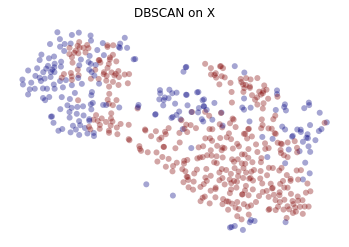

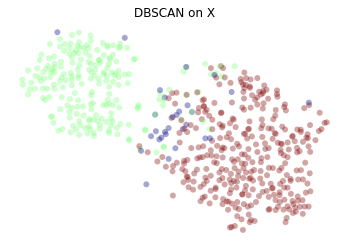

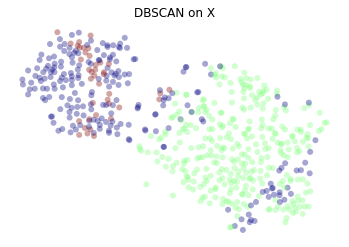

0.4692960796438981

In [26]:
X = StandardScaler().fit_transform(X)

dbsc = cluster.DBSCAN(eps=2.8, min_samples=10)
kY = dbsc.fit_predict(X)

plt.scatter(Y[:,0],Y[:,1],  c=kY, cmap = "jet", edgecolor = "None", alpha=0.35)
plt.title('DBSCAN on X')
plt.axis('off')
plt.show()




dbsc = cluster.DBSCAN(eps=0.33, min_samples=27, metric='cosine')
kY = dbsc.fit_predict(X)

plt.scatter(Y[:,0],Y[:,1],  c=kY, cmap = "jet", edgecolor = "None", alpha=0.35)
plt.title('DBSCAN on X')
plt.axis('off')
plt.show()



dbsc = cluster.DBSCAN(eps=0.25, min_samples=25, metric='euclidean')
kY = dbsc.fit_predict(principalDf.iloc[:,0:1])

plt.scatter(Y[:,0],Y[:,1],  c=kY, cmap = "jet", edgecolor = "None", alpha=0.35)
plt.title('DBSCAN on X')
plt.axis('off')
plt.show()


metrics.adjusted_rand_score(kY, datas['diagnosis'])


## Two or three clusters?

Suppose we had no knowledge about the diagnosis and we didn't know that there are only two options (B and M). How many clusters would we choose?

1. Use the elbow method to see if this shows wheter we should use two or three clusters. 
2. Try the clustering methods as used before, but now try to create three clusters. Does this looks plausible?
3. If you were convinced that there are three clusters instead of two, what could be done to support this hypothesis?



### Solution

Some examples/literature

http://www.sthda.com/english/articles/29-cluster-validation-essentials/96-determining-the-optimal-number-of-clusters-3-must-know-methods/
Elbow method, silhouette method, gap statistic

Gap statistic in python: https://anaconda.org/milesgranger/gap-statistic/notebook
Interpret gap statistic: https://stats.stackexchange.com/questions/95290/how-should-i-interpret-gap-statistic

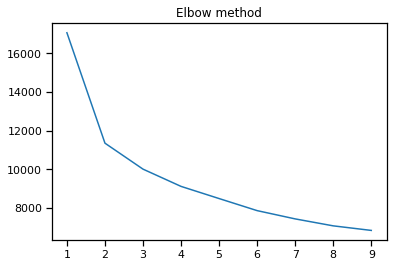

In [27]:
# No clear answer from the elbow method
from scipy.spatial.distance import cdist

distortions = []
K = range(1,10)
for k in K:
        kmean = KMeans(n_clusters=k).fit(X)
        kmean.fit(X)
        distortions.append(np.mean(kmean.inertia_))
        
plt.plot(K, distortions)
plt.title('Elbow method')
plt.show()


For n_clusters = 2 The average silhouette_score is : 0.33913490538774316


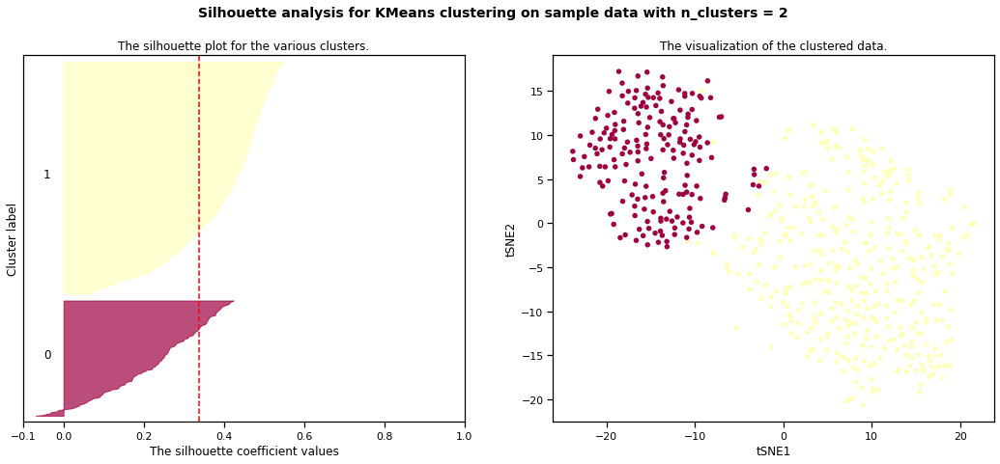

For n_clusters = 3 The average silhouette_score is : 0.29925799244505774


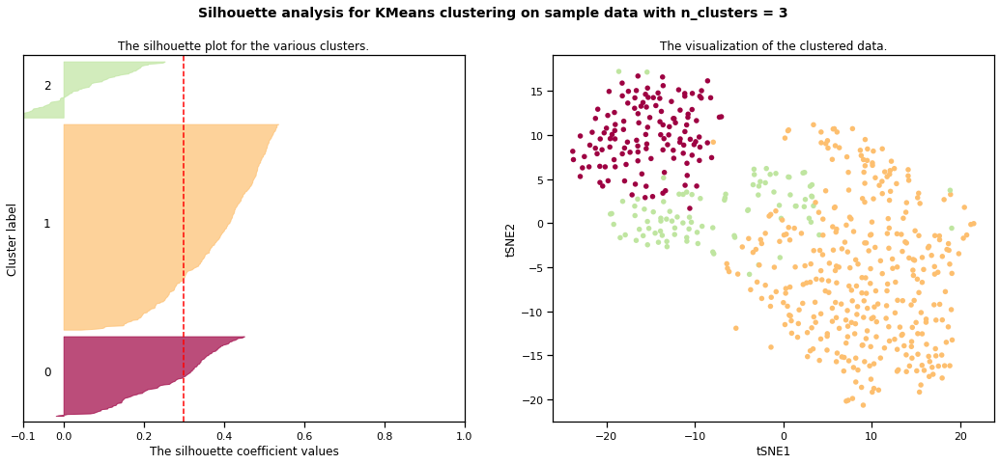

For n_clusters = 4 The average silhouette_score is : 0.17581329477083674


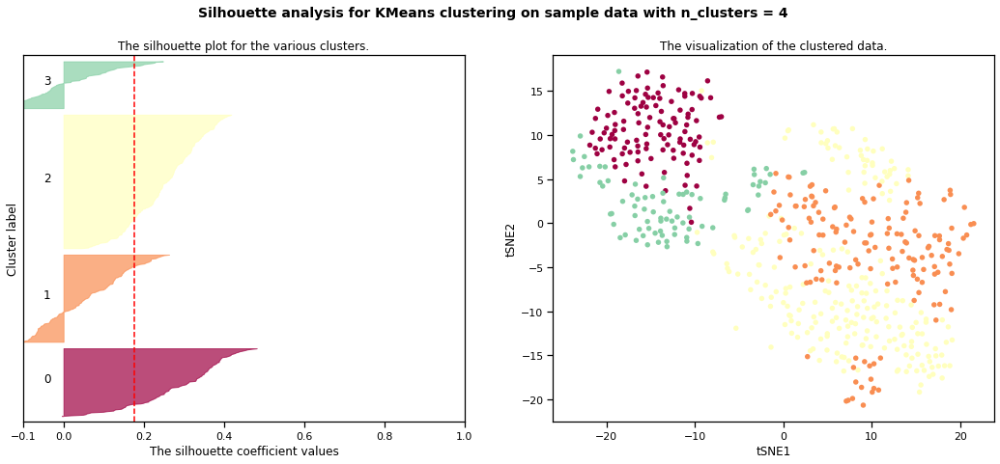

In [30]:
# The silhouette method suggests k=2

from sklearn.metrics import silhouette_samples, silhouette_score
cmap = cm.get_cmap("Spectral")

y = datas['diagnosis']
X = X

range_n_clusters = [2, 3, 4]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i


        color = cmap(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cmap(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(Y[:, 0], Y[:, 1], s=30, lw=0,
                c=colors, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("tSNE1")
    ax2.set_ylabel("tSNE2")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

    plt.show() 

In [35]:
# Gap statistic does not yield clear answer, also suggests 2 or 3

def optimalK(data, nrefs=3, maxClusters=15):
    """
    Calculates KMeans optimal K using Gap Statistic from Tibshirani, Walther, Hastie
    Params:
        data: ndarry of shape (n_samples, n_features)
        nrefs: number of sample reference datasets to create
        maxClusters: Maximum number of clusters to test for
    Returns: (gaps, optimalK)
    """
    gaps = np.zeros((len(range(1, maxClusters)),))
    resultsdf = pd.DataFrame({'clusterCount':[], 'gap':[]})
    for gap_index, k in enumerate(range(1, maxClusters)):

        # Holder for reference dispersion results
        refDisps = np.zeros(nrefs)

        # For n references, generate random sample and perform kmeans getting resulting dispersion of each loop
        for i in range(nrefs):
            
            # Create new random reference set
            randomReference = np.random.random_sample(size=data.shape)
            
            # Fit to it
            km = KMeans(k)
            km.fit(randomReference)
            
            refDisp = km.inertia_
            refDisps[i] = refDisp

        # Fit cluster to original data and create dispersion
        km = KMeans(k)
        km.fit(data)
        
        origDisp = km.inertia_

        # Calculate gap statistic
        gap = np.log(np.mean(refDisps)) - np.log(origDisp)

        # Assign this loop's gap statistic to gaps
        gaps[gap_index] = gap
        
        resultsdf = resultsdf.append({'clusterCount':k, 'gap':gap}, ignore_index=True)

    return (gaps.argmax() + 1, resultsdf)  # Plus 1 because index of 0 means 1 cluster is optimal, index 2 = 3 clusters are optimal
    

In [36]:
optimalK(data)

/var/folders/26/5fcsf8bs6lvdrmys57ttrlv80000gn/T/ipykernel_78292/566766636.py:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsdf = resultsdf.append({'clusterCount':k, 'gap':gap}, ignore_index=True)
/var/folders/26/5fcsf8bs6lvdrmys57ttrlv80000gn/T/ipykernel_78292/566766636.py:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsdf = resultsdf.append({'clusterCount':k, 'gap':gap}, ignore_index=True)
/var/folders/26/5fcsf8bs6lvdrmys57ttrlv80000gn/T/ipykernel_78292/566766636.py:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsdf = resultsdf.append({'clusterCount':k, 'gap':gap}, ignore_index=True)
/var/folders/26/5fcsf8bs6lvdrmys57ttrlv80000gn/T/ipykernel_78292/566766636.py:44: FutureWarning: The frame.appen

(14,
     clusterCount       gap
 0            1.0 -3.111868
 1            2.0 -2.235054
 2            3.0 -1.702161
 3            4.0 -1.393504
 4            5.0 -1.201871
 5            6.0 -1.041215
 6            7.0 -0.931179
 7            8.0 -0.857700
 8            9.0 -0.764572
 9           10.0 -0.695193
 10          11.0 -0.651150
 11          12.0 -0.591757
 12          13.0 -0.574135
 13          14.0 -0.520061)